In [ ]:
from google.colab import files
files.upload()


Saving kaggle (2).json to kaggle (2) (1).json


{'kaggle (2) (1).json': b'{"username":"vidhivilaschamat","key":"71d8805f1ac81283afaa375226f20a59"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!kaggle datasets list -s soil

ref                                                            title                                               size  lastUpdated                 downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  --------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
prasanshasatpathy/soil-types                                   Soil Types                                       3230259  2021-06-20 05:51:28.320000           5385         49  0.8125           
cdminix/us-drought-meteorological-data                         Predict Droughts using Weather & Soil Data     944795928  2021-03-03 19:38:35.597000          13248        241  1.0              
snmahsa/soil-nutrients                                         Soil Nutrients                                   1334361  2025-01-11 23:55:06.523000            679         43  0.7058824        
shankarpriya2913/crop-and-soil-data

In [ ]:
!kaggle datasets list -s agricultural-crops

ref                                                             title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
mdwaquarazam/agricultural-crops-image-classification            Agricultural crops image classification               82830492  2022-08-26 01:04:56.133000           9380        111  0.875            
atharvaingle/crop-recommendation-dataset                        Crop Recommendation Dataset                              65234  2020-12-19 05:01:46.843000          57024        465  0.7058824        
siddharthss/crop-recommendation-dataset                         Crop Recommendation Dataset                              65234  2021-05-25 13:09:48.843000          10633         62  1.0              


In [4]:
import json
import os

# Your Kaggle API token dictionary (from 'kaggle (1) (1).json')
token ={
  "username": "vidhivilaschamat",
  "key": "71d8805f1ac81283afaa375226f20a59"
}


In [5]:

# Save the token to ~/.kaggle/kaggle.json
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)
with open(os.path.expanduser("~/.kaggle/kaggle.json"), "w") as f:
    json.dump(token, f)


In [6]:
# Set file permissions
os.chmod(os.path.expanduser("~/.kaggle/kaggle.json"), 0o600)

In [ ]:
# Download your dataset
!kaggle datasets download -d vidhivilaschamat/farming-dataset

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/farming-dataset
License(s): unknown
farming-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
# Unzip the dataset
!unzip -q farming-dataset.zip -d farming_dataset

replace farming_dataset/farming_decision_support_extended_dataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y


In [ ]:
# List the files
print(" Dataset folder contents:")
print(os.listdir("farming_dataset"))

 Dataset folder contents:
['farming_decision_support_extended_dataset.csv']


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
import os
print(os.listdir("farming_dataset"))

['farming_decision_support_extended_dataset.csv']


In [ ]:
# List all files and folders inside the unzipped dataset
for root, dirs, files in os.walk("farming_dataset"):
    for name in files:
        print(os.path.join(root, name))

farming_dataset/farming_decision_support_extended_dataset.csv


In [ ]:
df=pd.read_csv('farming_dataset/farming_decision_support_extended_dataset.csv')
df.head()

,crop_name,variety_name,crop_type,growth_stage,soil_type,soil_texture,soil_pH,soil_organic_matter_pct,soil_nitrogen,soil_phosphorus,...,budget_estimate_usd,cost_breakdown_fertilizer_usd,cost_breakdown_labor_usd,cost_breakdown_irrigation_usd,profit_prediction_usd,gm_crop,gm_trait,planting_strategy_notes,sustainability_score,last_updated
0,Potato,Potato_Variety_2,Legume,Flowering,Loamy,Fine,7.23,1.25,49,4,...,12490.27,1347.89,2391.95,1134.02,47187.07,Yes,Pest Resistance,Plant Potato in Loamy soil with Sprinkler irri...,0.70,2025-01-31
1,Soybean,Soybean_Variety_1,Fiber,Vegetative,Sandy,Medium,5.83,2.01,35,23,...,16995.53,919.01,4086.48,641.00,127422.78,Yes,High Yield,Plant Soybean in Sandy soil with Drip irrigation.,0.67,2024-12-05
2,Soybean,Soybean_Variety_4,Legume,Seeding,Silty,Fine,7.95,1.10,4,29,...,11429.18,752.92,3720.91,1242.61,194605.36,Yes,Pest Resistance,Plant Soybean in Silty soil with Surface irrig...,0.91,2024-09-02
3,Potato,Potato_Variety_3,Cereal,Seeding,Peaty,Coarse,6.21,1.19,0,45,...,16063.24,981.78,2335.73,980.99,61071.86,Yes,Drought Resistance,Plant Potato in Peaty soil with Surface irriga...,1.00,2024-12-11
4,Cotton,Cotton_Variety_5,Tuber,Seeding,Peaty,Fine,7.50,2.96,54,53,...,8180.84,761.26,3151.51,868.19,76103.26,No,NaN,Plant Cotton in Peaty soil with Drip irrigation.,0.15,2025-04-07


In [ ]:
df.tail()

,crop_name,variety_name,crop_type,growth_stage,soil_type,soil_texture,soil_pH,soil_organic_matter_pct,soil_nitrogen,soil_phosphorus,...,budget_estimate_usd,cost_breakdown_fertilizer_usd,cost_breakdown_labor_usd,cost_breakdown_irrigation_usd,profit_prediction_usd,gm_crop,gm_trait,planting_strategy_notes,sustainability_score,last_updated
10995,Rice,Rice_Variety_4,Tuber,Harvesting,Chalky,Fine,6.83,2.24,52,82,...,12489.58,763.89,2455.74,1070.61,287289.02,No,NaN,Plant Rice in Chalky soil with Sprinkler irrig...,0.48,2024-09-19
10996,Barley,Barley_Variety_3,Legume,Seeding,Clay,Medium,7.96,4.32,60,47,...,18335.56,1702.75,3635.00,1273.28,172382.78,No,NaN,Plant Barley in Clay soil with Manual irrigation.,0.36,2024-08-30
10997,Maize,Maize_Variety_3,Legume,Vegetative,Chalky,Fine,7.08,1.65,72,26,...,7745.21,1165.53,1510.16,1096.17,72172.33,Yes,Drought Resistance,Plant Maize in Chalky soil with Surface irriga...,0.24,2024-11-08
10998,Maize,Maize_Variety_4,Fiber,Harvesting,Sandy,Coarse,5.91,1.16,26,44,...,10535.03,1030.11,3848.89,706.42,79282.49,No,NaN,Plant Maize in Sandy soil with Sprinkler irrig...,0.17,2024-08-12
10999,Maize,Maize_Variety_5,Legume,Flowering,Silty,Medium,6.94,1.41,33,99,...,16197.79,1577.06,3221.98,946.09,66237.58,No,NaN,Plant Maize in Silty soil with Sprinkler irrig...,0.86,2024-05-15


In [ ]:
df.columns

Index(['crop_name', 'variety_name', 'crop_type', 'growth_stage', 'soil_type',
       'soil_texture', 'soil_pH', 'soil_organic_matter_pct', 'soil_nitrogen',
       'soil_phosphorus', 'soil_potassium', 'soil_salinity', 'weather_temp_C',
       'weather_min_temp_C', 'weather_max_temp_C', 'weather_rainfall_mm',
       'weather_humidity_pct', 'weather_wind_speed_kmph',
       'weather_sunlight_hours', 'irrigation_type',
       'irrigation_frequency_per_week', 'irrigation_volume_liters_per_hectare',
       'recommended_crop', 'recommended_variety', 'fertilizer_type',
       'fertilizer_brand', 'fertilizer_dosage_kg_per_hectare',
       'fertilizer_application_stage', 'pest_disease_detected',
       'disease_severity', 'treatment_suggested', 'treatment_method',
       'yield_prediction_kg_per_hectare', 'expected_yield_range',
       'harvest_time_days', 'harvest_method', 'post_harvest_storage',
       'market_price_per_kg', 'market_demand_index', 'budget_estimate_usd',
       'cost_breakdown_

In [ ]:
df.shape

(11000, 49)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 49 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   crop_name                             11000 non-null  object 
 1   variety_name                          11000 non-null  object 
 2   crop_type                             11000 non-null  object 
 3   growth_stage                          11000 non-null  object 
 4   soil_type                             11000 non-null  object 
 5   soil_texture                          11000 non-null  object 
 6   soil_pH                               11000 non-null  float64
 7   soil_organic_matter_pct               11000 non-null  float64
 8   soil_nitrogen                         11000 non-null  int64  
 9   soil_phosphorus                       11000 non-null  int64  
 10  soil_potassium                        11000 non-null  int64  
 11  soil_salinity  

In [ ]:
#Check null values
print("Print null values :/n",df.isnull().sum())

Print null values :/n crop_name                                  0
variety_name                               0
crop_type                                  0
growth_stage                               0
soil_type                                  0
soil_texture                               0
soil_pH                                    0
soil_organic_matter_pct                    0
soil_nitrogen                              0
soil_phosphorus                            0
soil_potassium                             0
soil_salinity                              0
weather_temp_C                             0
weather_min_temp_C                         0
weather_max_temp_C                         0
weather_rainfall_mm                        0
weather_humidity_pct                       0
weather_wind_speed_kmph                    0
weather_sunlight_hours                     0
irrigation_type                            0
irrigation_frequency_per_week              0
irrigation_volume_liters_per_hect

In [ ]:
# Handle null values
for col in df.columns:
    if df[col].dtype == 'object':
        df[col].fillna(df[col].mode()[0], inplace=True)
    else:
        df[col].fillna(df[col].mean(), inplace=True)

<ipython-input-56-a5a2686ce53b>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
<ipython-input-56-a5a2686ce53b>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using

In [ ]:
#Check null values
print("Print null values :/n",df.isnull().sum())

Print null values :/n crop_name                               0
variety_name                            0
crop_type                               0
growth_stage                            0
soil_type                               0
soil_texture                            0
soil_pH                                 0
soil_organic_matter_pct                 0
soil_nitrogen                           0
soil_phosphorus                         0
soil_potassium                          0
soil_salinity                           0
weather_temp_C                          0
weather_min_temp_C                      0
weather_max_temp_C                      0
weather_rainfall_mm                     0
weather_humidity_pct                    0
weather_wind_speed_kmph                 0
weather_sunlight_hours                  0
irrigation_type                         0
irrigation_frequency_per_week           0
irrigation_volume_liters_per_hectare    0
recommended_crop                        0
recommended_

In [ ]:
# Drop duplicates
df.drop_duplicates(inplace=True)

In [ ]:
#Standardize numeric features
scaler = StandardScaler()
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

In [ ]:
#Train-test split
X = df.drop(columns=df.columns[-1])  # Assume last column is the target
y = df[df.columns[-1]]               # Adjust this if your target column is known
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#Data Visualization

In [ ]:
y = df['recommended_crop']  # or whatever your target is
print(y.value_counts())

recommended_crop
Rice         1428
Potato       1399
Sugarcane    1397
Cotton       1380
Maize        1376
Soybean      1374
Wheat        1325
Barley       1321
Name: count, dtype: int64


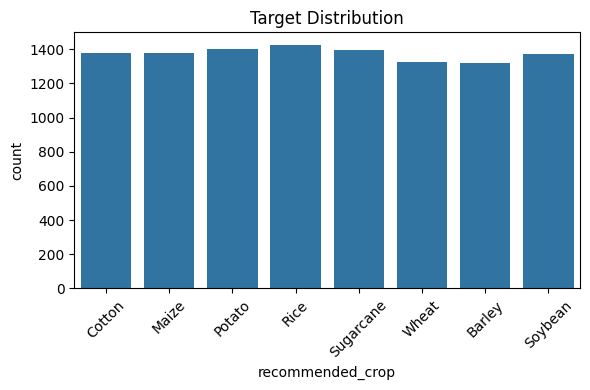

In [ ]:
# Bar plot
if y.nunique() < 20:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=y)
    plt.title("Target Distribution")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


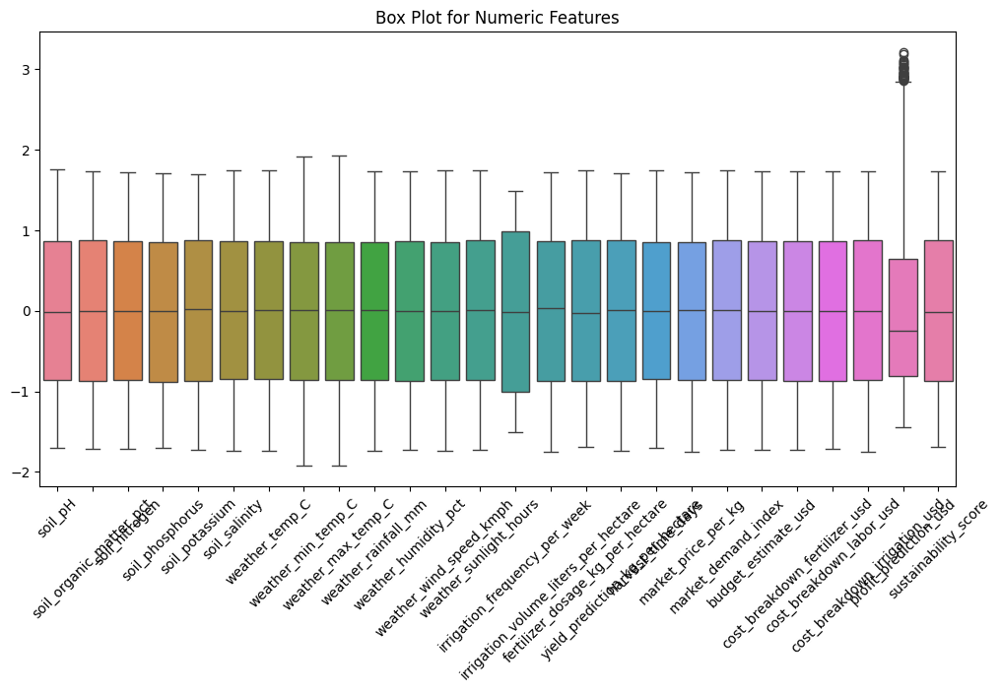

In [ ]:
# Box Plot (for numeric features)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numeric_cols])
plt.xticks(rotation=45)
plt.title("Box Plot for Numeric Features")
plt.show()

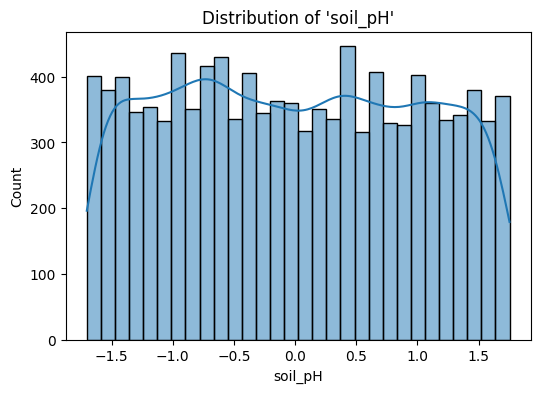

In [ ]:
# Distribution Plot (histogram + KDE for a sample feature)
 # Choose the first numeric column
sample_feature = numeric_cols[0]
plt.figure(figsize=(6, 4))
sns.histplot(df[sample_feature], kde=True, bins=30)
plt.title(f"Distribution of '{sample_feature}'")
plt.show()

In [ ]:
#ALGORITHMS

In [ ]:
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Make a copy to preserve original data
df_encoded = df.copy()

# Encode all object (string) columns
for col in df_encoded.select_dtypes(include='object'):
    df_encoded[col] = LabelEncoder().fit_transform(df_encoded[col])


In [ ]:
# Replace 'recommended_crop' with your actual target column
X = df_encoded.drop('recommended_crop', axis=1)
y = df_encoded['recommended_crop']


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
#ML algorithm

In [ ]:
#Decision tree
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_pred = dt.predict(X_test)

In [ ]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       258
           1       1.00      1.00      1.00       275
           2       1.00      1.00      1.00       276
           3       1.00      1.00      1.00       277
           4       1.00      1.00      1.00       288
           5       1.00      1.00      1.00       270
           6       1.00      1.00      1.00       280
           7       1.00      1.00      1.00       276

    accuracy                           1.00      2200
   macro avg       1.00      1.00      1.00      2200
weighted avg       1.00      1.00      1.00      2200



In [ ]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 100.00


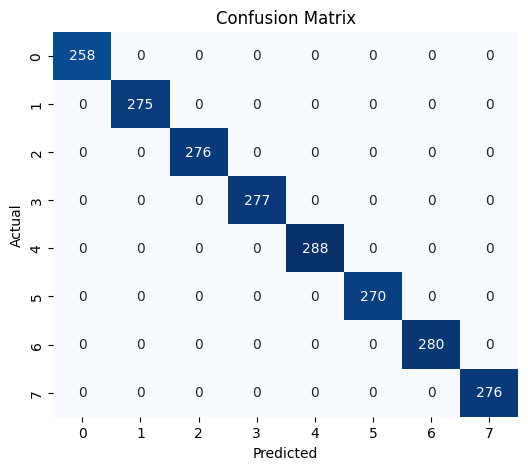

In [ ]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [ ]:
# Support Vector Machine
svm = SVC()
svm.fit(X_train, y_train)

SVC()

In [ ]:
y_pred = svm.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 12.64


In [ ]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       258
           1       0.00      0.00      0.00       275
           2       0.18      0.04      0.06       276
           3       0.11      0.16      0.13       277
           4       0.13      0.64      0.21       288
           5       0.13      0.15      0.14       270
           6       0.00      0.00      0.00       280
           7       0.00      0.00      0.00       276

    accuracy                           0.13      2200
   macro avg       0.07      0.12      0.07      2200
weighted avg       0.07      0.13      0.07      2200



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


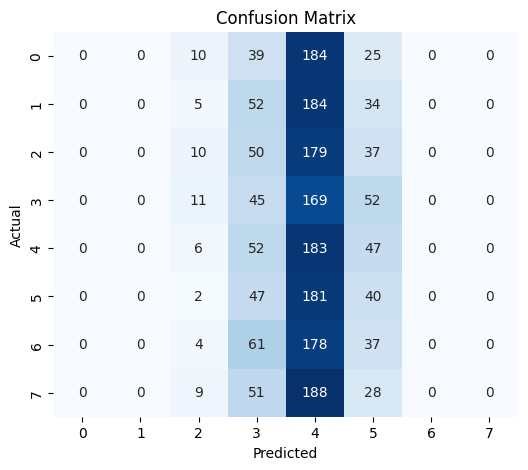

In [ ]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [ ]:
# Replace 'fertilizer_type' with your new target column
target_col = 'fertilizer_type'

X = df_encoded.drop(target_col, axis=1)
y = df_encoded[target_col]


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#Random Forest
rf=RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = rf.predict(X_test)

In [ ]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.15      0.19      0.17       365
           1       0.13      0.14      0.14       357
           2       0.18      0.16      0.17       362
           3       0.17      0.15      0.16       396
           4       0.17      0.19      0.18       362
           5       0.16      0.13      0.14       358

    accuracy                           0.16      2200
   macro avg       0.16      0.16      0.16      2200
weighted avg       0.16      0.16      0.16      2200



In [ ]:
accuracy = accuracy_score(y_test, y_pred)*100
print(f"Accuracy Score: {accuracy:.2f}")

Accuracy Score: 16.09


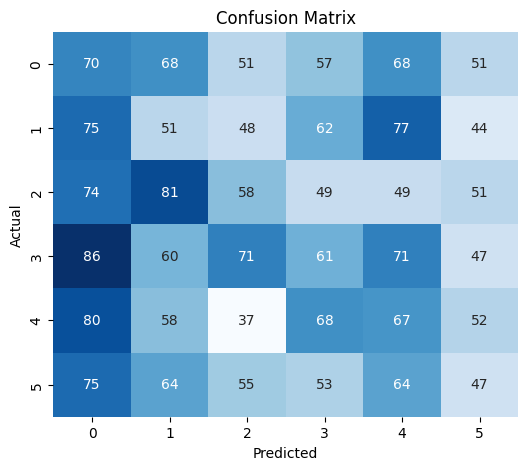

In [ ]:
 # Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix with seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title(f'Confusion Matrix')
plt.show()

In [ ]:
#Regression

In [ ]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred = lr.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))

MSE: 2.8875110470360776


In [ ]:
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
y_pred = rf.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))

MSE: 2.9220929545454544


In [ ]:
#Deep Learning algorithm

#crop image dataset

In [ ]:
import tensorflow as tf

In [ ]:
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

TensorFlow version: 2.18.0
Num GPUs Available: 0


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
# Download your dataset
!kaggle datasets download -d vidhivilaschamat/images-of-crop

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/images-of-crop
License(s): unknown


In [ ]:
!unzip -o -q images-of-crop.zip -d images-of-crop


In [ ]:
print("CSV file exists:", os.path.exists("images-of-crop/Crop_details.csv"))
print("Sample images in 'jute':", os.listdir("images-of-crop/crop_images/jute")[:5])


CSV file exists: True
Sample images in 'jute': ['jute037a.jpeg', 'jute006a.jpeg', 'jute004a.jpeg', 'jute032a.jpeg', 'jute033a.jpeg']


In [ ]:
# Replace with your target folder if different
dataset_folder = "images-of-crop"

for root, dirs, files in os.walk(dataset_folder):
    for name in files:
        print(os.path.join(root, name))


images-of-crop/Crop_details.csv
images-of-crop/some_more_images/some_more_images/maize/maize046a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize050a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize048a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize049a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize047a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize044a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize045a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize041a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize042a.jpg
images-of-crop/some_more_images/some_more_images/maize/maize043a.jpg
images-of-crop/some_more_images/some_more_images/rice/rice043a.jpg
images-of-crop/some_more_images/some_more_images/rice/rice050a.jpg
images-of-crop/some_more_images/some_more_images/rice/rice041a.jpg
images-of-crop/some_more_images/some_more_images/rice/rice042a.jpg
images-of-

In [ ]:
# Dataset path
crop_image = "images-of-crop/crop_images"


In [ ]:
# Image Parameters
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_data = train_datagen.flow_from_directory(
    crop_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_data = train_datagen.flow_from_directory(
    crop_image,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)


Found 161 images belonging to 5 classes.
Found 40 images belonging to 5 classes.


In [ ]:
# Take one batch from the generator
image_batch, label_batch = next(train_data)

# Decode labels from one-hot to class index
labels = tf.argmax(label_batch, axis=1)

# Get class names from the generator
class_names = list(train_data.class_indices.keys())

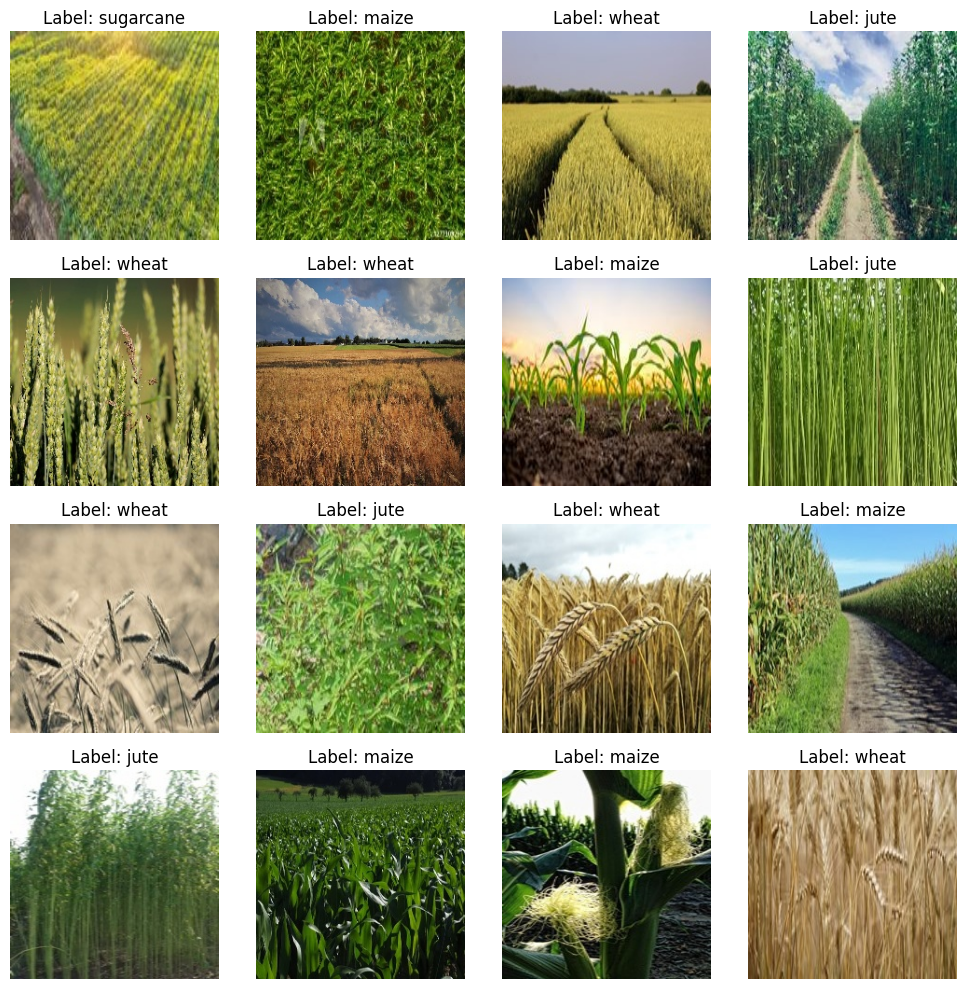

In [ ]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    img = image_batch[i]
    label = labels[i].numpy()
    plt.imshow(img)  # images are already scaled RGB
    plt.title(f'Label: {class_names[label]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# CNN Model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_data,  # Using the training data generator
    validation_data=val_data,  # Using the validation data generator
    epochs=6
)

Epoch 1/6


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.1808 - loss: 6.0572 - val_accuracy: 0.2000 - val_loss: 1.7453
Epoch 2/6
6/6 ━━━━━━━━━━━━━━━━━━━━ 29s 5s/step - accuracy: 0.1887 - loss: 1.7657 - val_accuracy: 0.3000 - val_loss: 1.6203
Epoch 3/6
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - accuracy: 0.1660 - loss: 1.6183 - val_accuracy: 0.2000 - val_loss: 1.5997
Epoch 4/6
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - accuracy: 0.1931 - loss: 1.6573 - val_accuracy: 0.2500 - val_loss: 1.6025
Epoch 5/6
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 4s/step - accuracy: 0.2449 - loss: 1.6189 - val_accuracy: 0.2000 - val_loss: 1.5885
Epoch 6/6
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - accuracy: 0.2708 - loss: 1.5930 - val_accuracy: 0.2000 - val_loss: 1.5819


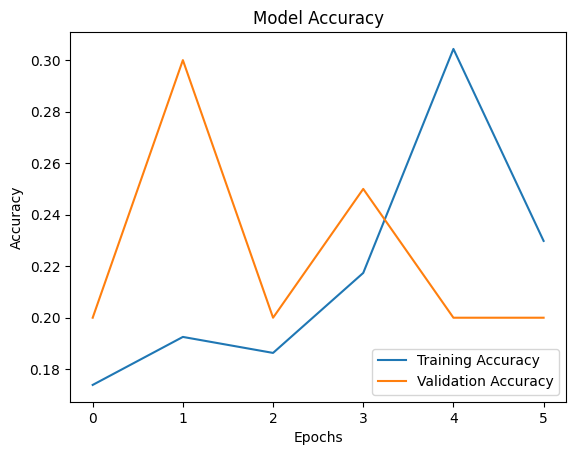

In [ ]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#Save model
model.save('crop_image_cnn_model.h5')

In [ ]:
#Agricultural crops image dataset

In [ ]:
!kaggle datasets download -d vidhivilaschamat/agricultural-crops

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/agricultural-crops
License(s): unknown


In [ ]:
!unzip -o -q agricultural-crops.zip -d agricultural_crops

In [ ]:
import os
print(os.listdir("agricultural_crops"))

['Agricultural-crops']


In [ ]:
agricultural_crops = "agricultural_crops"

In [ ]:
IMAGE_SIZE = (180, 180)
BATCH_SIZE = 32

In [ ]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_data = datagen.flow_from_directory(
    agricultural_crops,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

val_data = datagen.flow_from_directory(
   agricultural_crops,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 664 images belonging to 1 classes.
Found 165 images belonging to 1 classes.


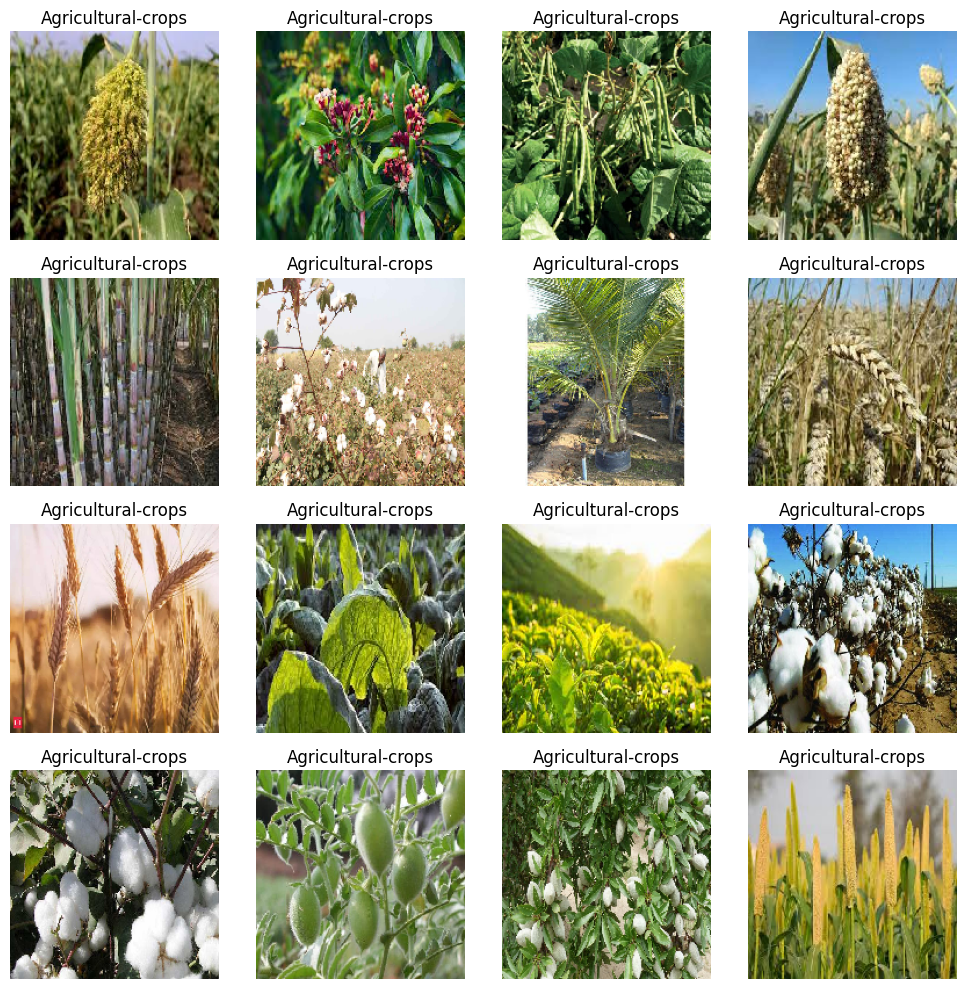

In [ ]:
# Get class indices and reverse map to class names
class_names = list(train_data.class_indices.keys())

# Get one batch of images and labels
images, labels = next(train_data)

# Plot 16 images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])  # Get index of the class
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# CNN Model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:

history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=4
)

Epoch 1/4


/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py:907: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py:33: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.fn(y_true, y_pred, **self._fn_kwargs)


21/21 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/4
21/21 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


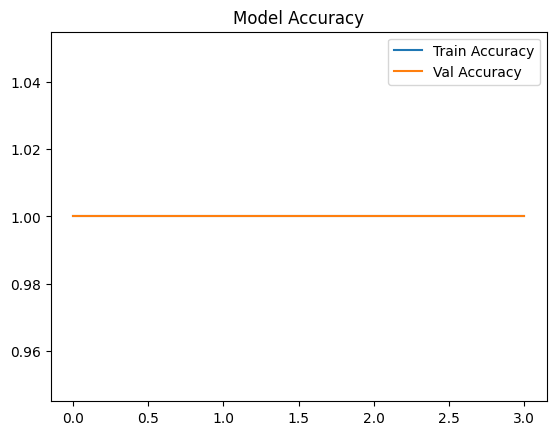

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Model Accuracy")
plt.legend()
plt.show()

In [ ]:
model.save("agricultural_crop_classifier.h5")

In [7]:
#Soil type dataset

In [8]:
!kaggle datasets download -d vidhivilaschamat/type-of-soil

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/type-of-soil
License(s): unknown


In [10]:
!unzip -o -q type-of-soil.zip -d type-of-soil

In [11]:
import os
print(os.listdir("type-of-soil"))

['Soil types']


In [16]:
soil_type = "type-of-soil"

In [17]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [18]:
# Data Generator
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Load Training Data
train_data = datagen.flow_from_directory(
    soil_type,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

#Load Validation Data
val_data = datagen.flow_from_directory(
    soil_type,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 125 images belonging to 1 classes.
Found 31 images belonging to 1 classes.


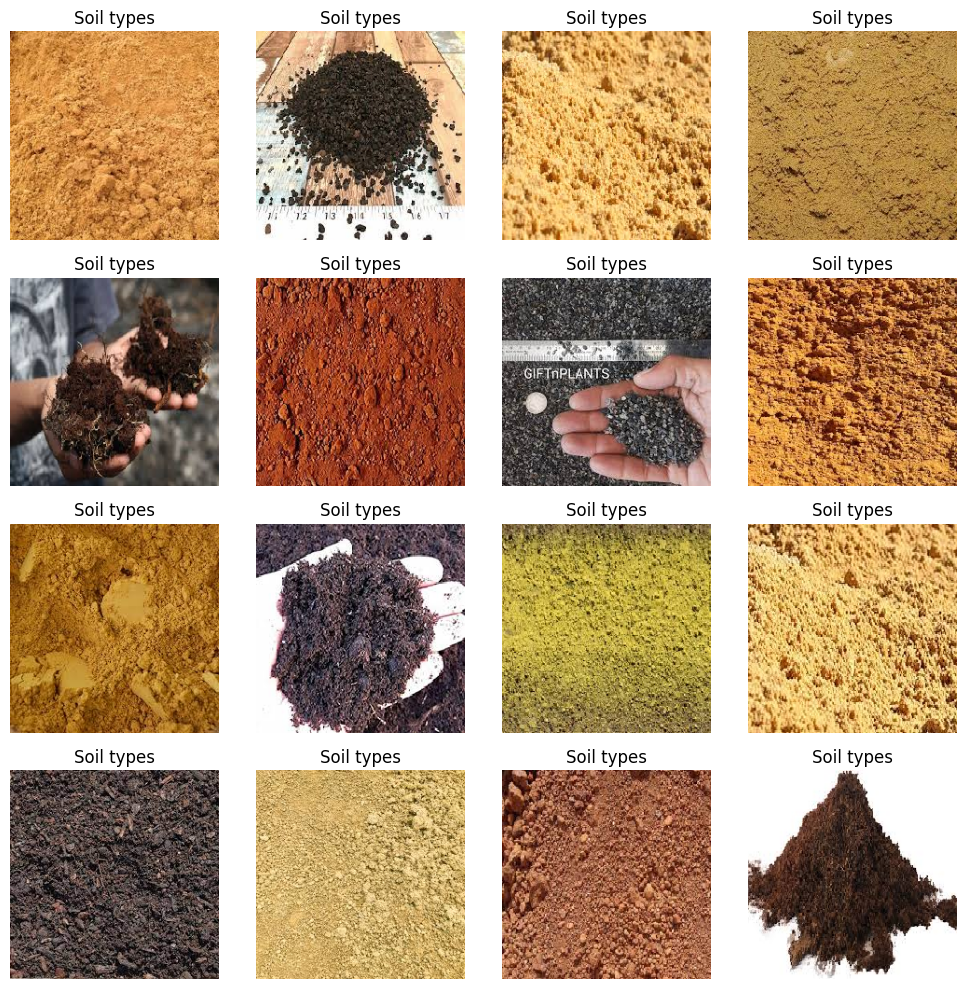

In [19]:
images, labels = next(train_data)

# Get class names from the generator
class_names = list(train_data.class_indices.keys())

# Plot 16 sample images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])  # Convert one-hot to class index
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [20]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [21]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [22]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=5
)

Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py:907: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py:33: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.f

4/4 ━━━━━━━━━━━━━━━━━━━━ 27s 6s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 39s 6s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 15s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 5s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 5/5
4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 5s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


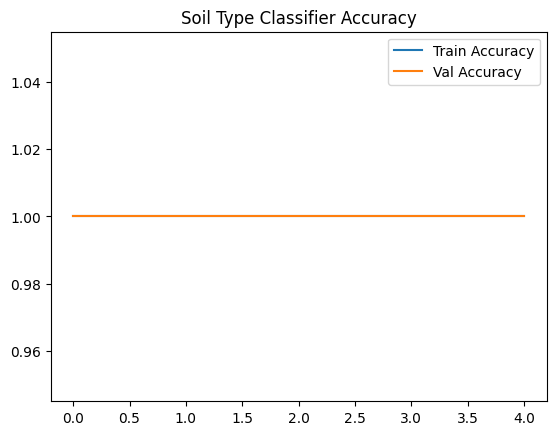

In [23]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Soil Type Classifier Accuracy")
plt.legend()
plt.show()

In [26]:
model.save("soil_type_classifier.h5")

In [35]:
#Vegetable dataset

In [36]:
!kaggle datasets download -d vidhivilaschamat/vegetable-image

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/vegetable-image
License(s): unknown
vegetable-image.zip: Skipping, found more recently modified local copy (use --force to force download)


In [37]:
!unzip -o -q vegetable-image.zip -d vegetable-image

In [41]:
import os
print(os.listdir("vegetable-image"))

['Soil types', 'Vegetable Images']


In [42]:
vegetable_images = "vegetable-image"

In [43]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [45]:
# Data Generator with Rescaling + Validation Split
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Load Training Data
train_data = datagen.flow_from_directory(
    vegetable_images,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)
# Load Validation Data
val_data = datagen.flow_from_directory(
    vegetable_images,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 16925 images belonging to 2 classes.
Found 4231 images belonging to 2 classes.


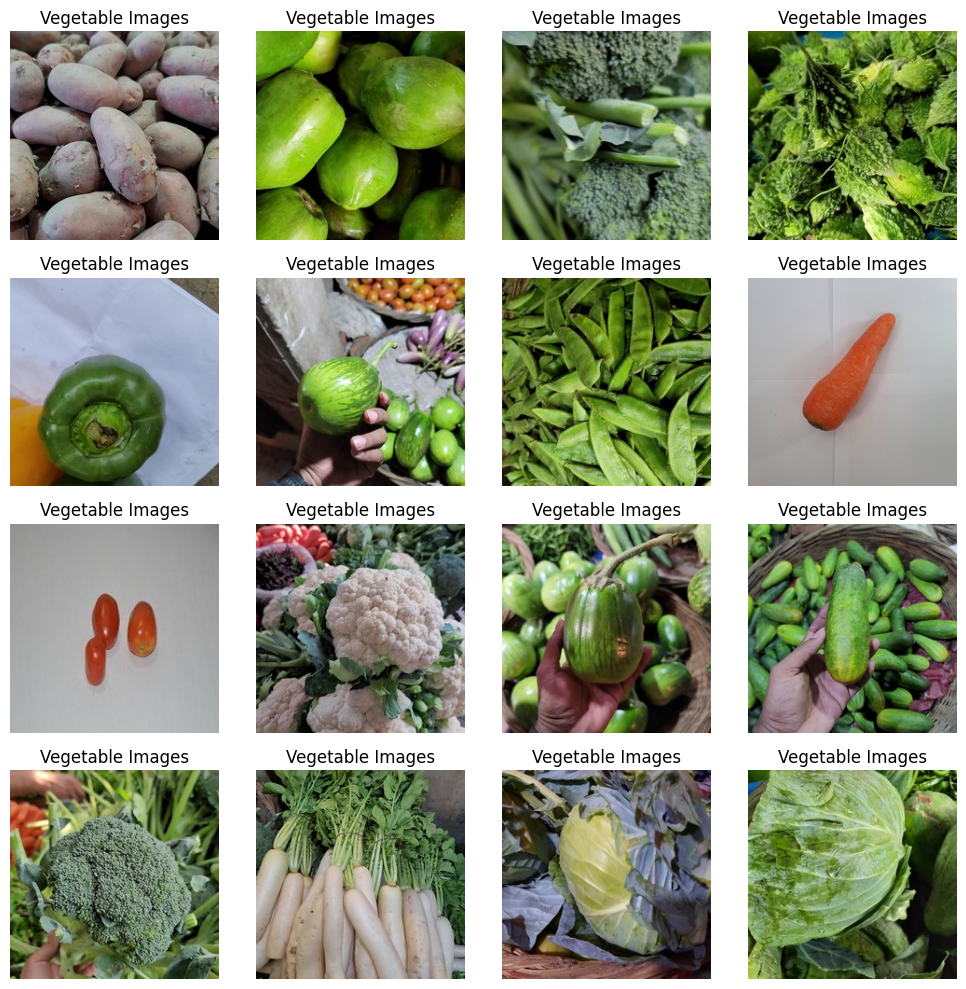

In [46]:
class_names = list(train_data.class_indices.keys())

# Get one batch of images and labels
images, labels = next(train_data)

# Plot 16 vegetable images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [47]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [48]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [63]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=2
)

Epoch 1/2
139/139 ━━━━━━━━━━━━━━━━━━━━ 546s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/2
139/139 ━━━━━━━━━━━━━━━━━━━━ 534s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


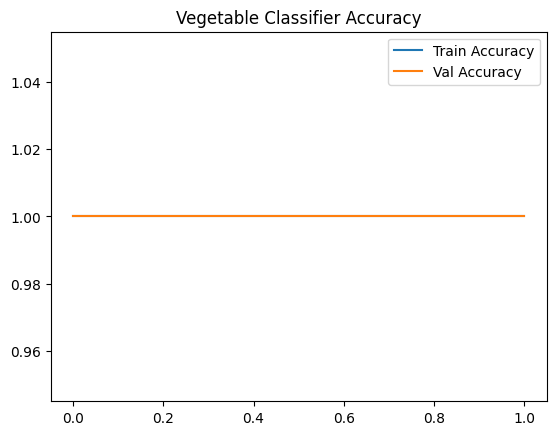

In [64]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Vegetable Classifier Accuracy")
plt.legend()
plt.show()
model.save("vegetable_classifier_model.h5")

In [65]:
model.save("vegetable_classifier_model.h5")

In [50]:
#Pest and disease dataset

In [51]:
!kaggle datasets download -d vidhivilaschamat/pest-and-disease

Dataset URL: https://www.kaggle.com/datasets/vidhivilaschamat/pest-and-disease
License(s): unknown


In [52]:
!unzip -o -q pest-and-disease.zip -d pest-and-disease

In [53]:
print(os.listdir("pest-and-disease"))

['pest and disease']


In [54]:
pest_and_disease = "pest-and-disease"

In [55]:
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

In [56]:
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Training Data
train_data = datagen.flow_from_directory(
    pest_and_disease,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)
# Validation Data
val_data = datagen.flow_from_directory(
    pest_and_disease,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 4447 images belonging to 1 classes.
Found 1111 images belonging to 1 classes.


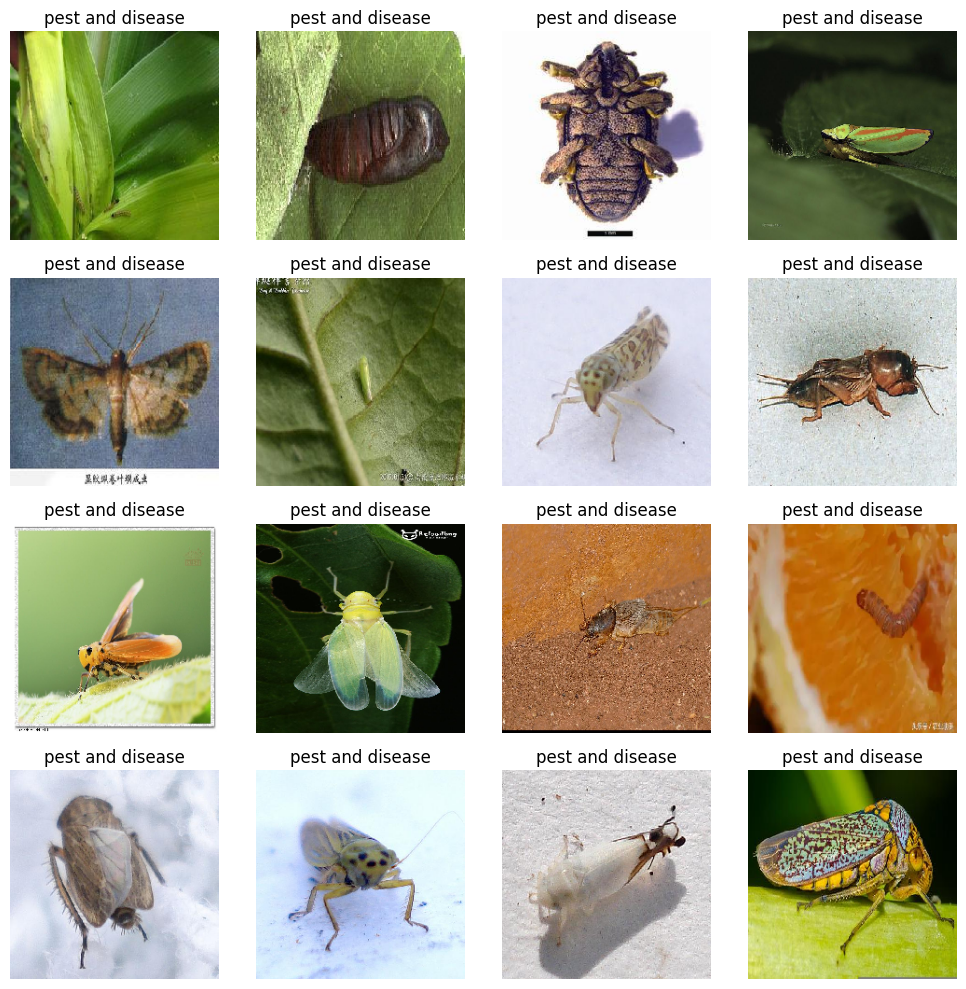

In [57]:
# Get class names
class_names = list(train_data.class_indices.keys())

# Get one batch from training data
images, labels = next(train_data)

# Plot 16 images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])
    plt.title(f"{class_names[label_index]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [58]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SIZE + (3,)),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_data.num_classes, activation='softmax')
])

In [59]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [60]:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=2
)

Epoch 1/2


/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py:907: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py:33: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.fn(y_true, y_pred, **self._fn_kwargs)


139/139 ━━━━━━━━━━━━━━━━━━━━ 544s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/2
139/139 ━━━━━━━━━━━━━━━━━━━━ 559s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


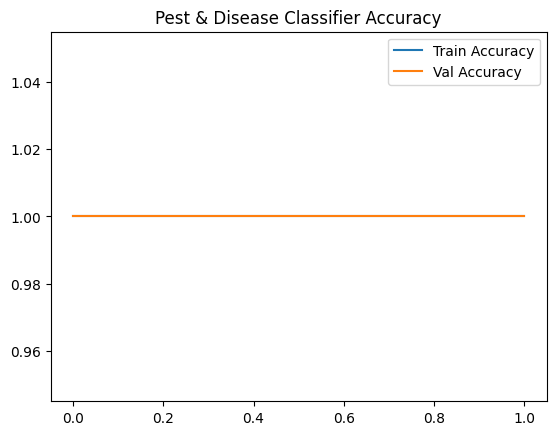

In [61]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Pest & Disease Classifier Accuracy")
plt.legend()
plt.show()

In [62]:
model.save("pest_disease_classifier_model.h5")